# Working with Images

By leveraging the power of some common libraries, such as `pillow`, Python gains the ability to work with and manipulate images for simple tasks. You can install Pillow by running :

`pip install pillow`

In case of any issues, you can refer to [their official documentation](http://pillow.readthedocs.io/en/3.4.x/installation.html) on installation. But for most computers, the simple pip install method should work.

**Note: When working with images in the jupyter notebook, you may get the following warning :**

    IOPub data rate exceeded.
    The notebook server will temporarily stop sending output to the client in order to avoid crashing it.

To change this limit, set the config variable `--NotebookApp.iopub_data_rate_limit`.

**If you get this warning, try stopping the notebook at the command line, then restarting it with :**

`jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10`

**At the command line. Basically, this adds a "flag" that the limit should be raised during this session of jupyter notebook that you are running.**

### Working with Pillow library

#### Opening Images

You can use `Pillow` to open image files. For a jupyter notebook, to show the file simply type the variable name holding the image. For other IDEs, like PyCharm, the image variable will have a [`.show()`](https://stackoverflow.com/questions/28139637/how-can-i-display-an-image-using-pillow) method in order to view the image.

In [1]:
from PIL import Image

In [3]:
avengerImg = Image.open('exampleA.jpeg')

In [7]:
# Note, this is a specialized file type from PIL (pillow)

type(avengerImg)

PIL.JpegImagePlugin.JpegImageFile

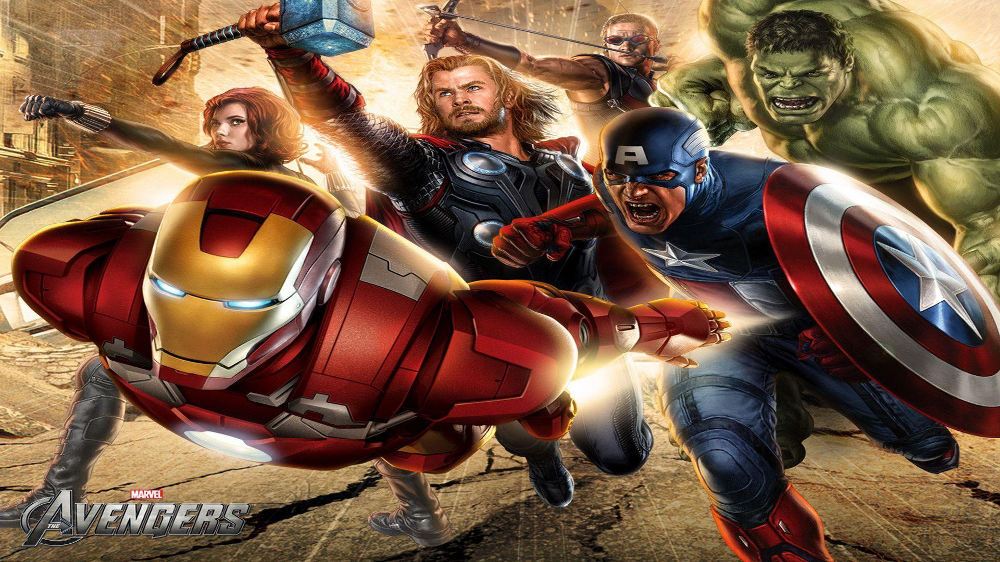

In [6]:
avengerImg



#### Image Information

In [9]:
# (width, height)

avengerImg.size

(1920, 1080)

In [11]:
avengerImg.filename

'exampleA.jpeg'

In [16]:
print("Format is :" ,avengerImg.format)

print("Format Description is :" ,avengerImg.format_description)

Format is : JPEG
Format Description is : JPEG (ISO 10918)


### Cropping Images

To crop images (i.e. grab a sub-section) use the `crop()` method on the image object. The crop() method returns a rectangular region from this image. The box is a 4-tuple defining the _left, upper, right, and lower pixel coordinate_.

**Note! -** If you take a look at the documentation string, it says the tuple you pass in is defined as `(x,y,w,h)`. These variables can be a bit deceiving. It's not really a height or width that is being passed, but instead the end coordinates of your width and height.

All the coordinates of box `(x, y, w, h)` are measured from the top left corner of the image. The upper-leftmost corner of mage is termed as the `Origin` or `(0, 0)`.

**Remember, all these 4 values are coordinates! i.e. `(x,y)` is upper leftmost coordinate & `(w,h)` is bottom rightmost cordinate, of the section being cropped.**

Let's grab out our IRON-MAN 😎.

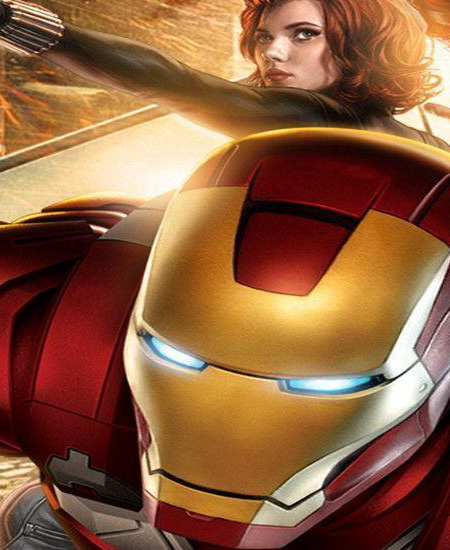

In [90]:
avengerImg.crop((150,200,600,750))

In [91]:
avengerImg.size

(1920, 1080)

Let's try to grab the logo of "Avengers" from the bottom left corner, by cropping the _avengerImg_ image.

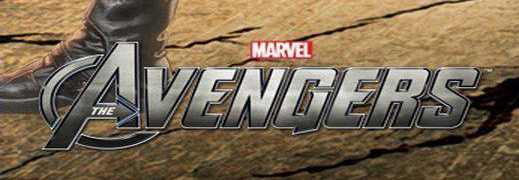

In [44]:
x = 0
y = 900
w = 1920/3.7
h = 1080

avengerImg.crop((x,y,w,h))

## Copying and Pasting Images

We can create copies with the `copy()` method and paste images on top of others with the `paste()` method.

In [46]:
x = 0
y = 900
w = 1920/3.7
h = 1080

logo = avengerImg.crop((x,y,w,h))       # cropping out the logo from original image.

In [47]:
avengerImg.paste(im=logo, box=(0,0))

# pasting 'logo' on original image at the (0,0) location.

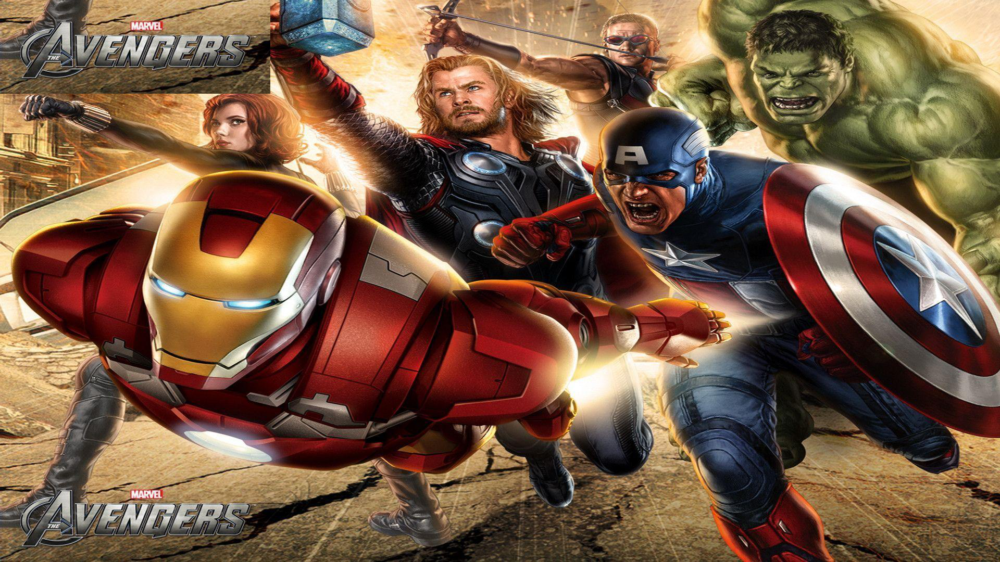

In [49]:
avengerImg

# so, here it is. Looks cool right! 😀


<br>**Remember :** Pasting does not affect/change the original image in-place, here everythng is happening in memory of browser. If needed you can reassign the newly created image, formed due to pasting process, back to previous variable. 

### Resizing

You can use the `resize()` method to resize an image.
Let's take a square image as example.

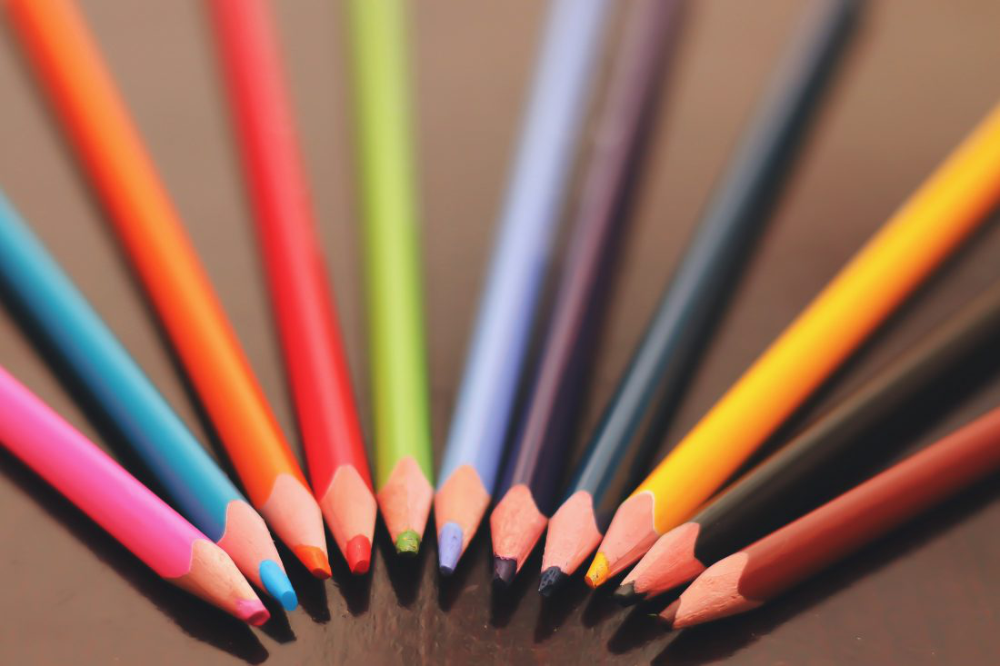

In [70]:
pencils = Image.open('exampleB.jpeg')

pencils

In [71]:
pencils.size

(1100, 733)

In [72]:
h, w = pencils.size

In [73]:
new_h = int(h/3)
new_w = int(w/3)

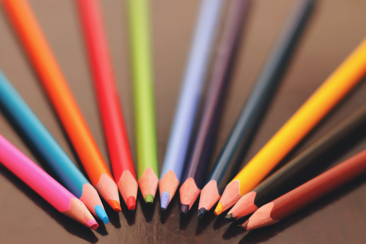

In [74]:
# Note this is not permanent change
# for permanent change, do a reassignment
# e.g. pencils = pencils.resize((100,100))
pencils.resize((new_h,new_w))

Can also stretch and squeeze.

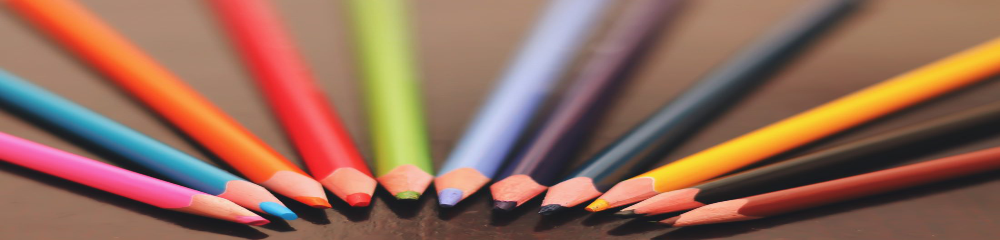

In [75]:
pencils.resize((2500, 600))

### Rotating the Images

In order to rotate images, specify the amount of degrees to rotate on the `rotate()` method. The original dimensions will be kept and "filled" in with black. You can optionally pass in the expand parameter to fill the new rotated image to the old dimensions.

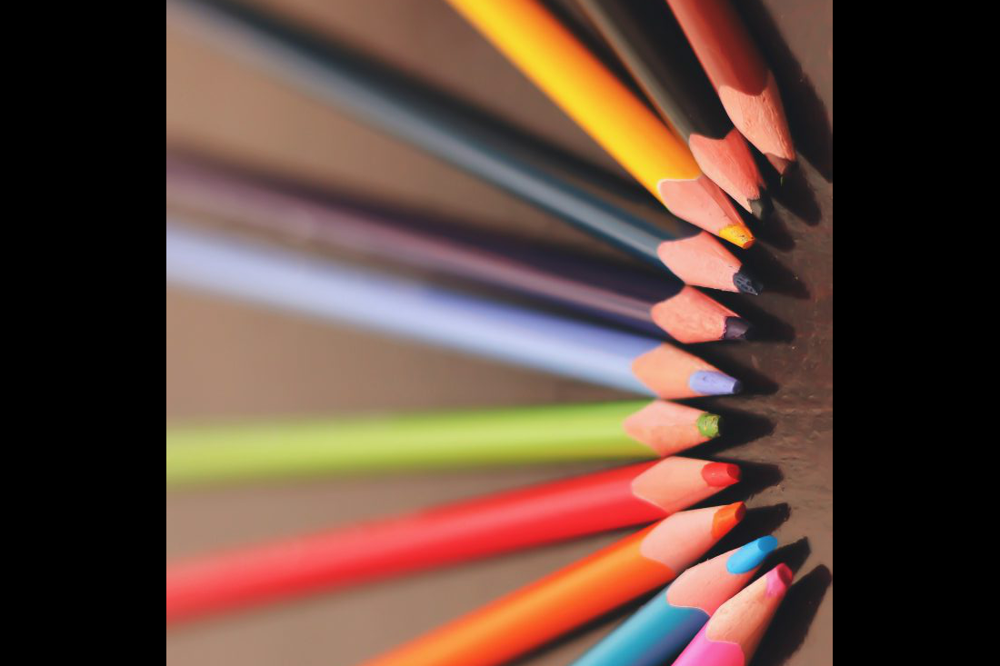

In [76]:
pencils.rotate(90)

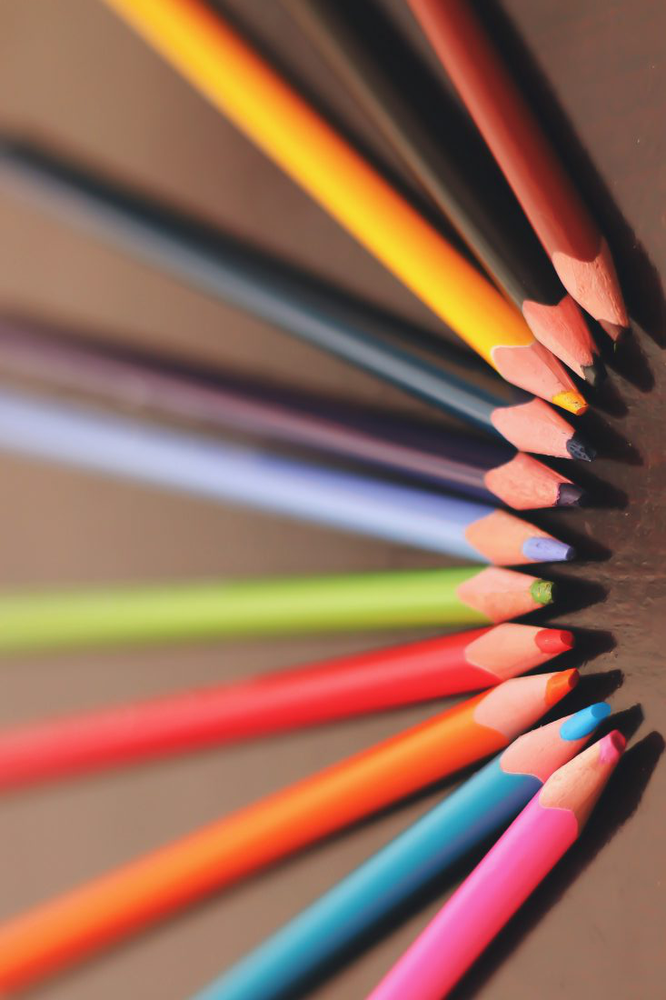

In [77]:
pencils.rotate(90, expand=True)


<br><br>
Notice what happens when we rotate by 120˚.

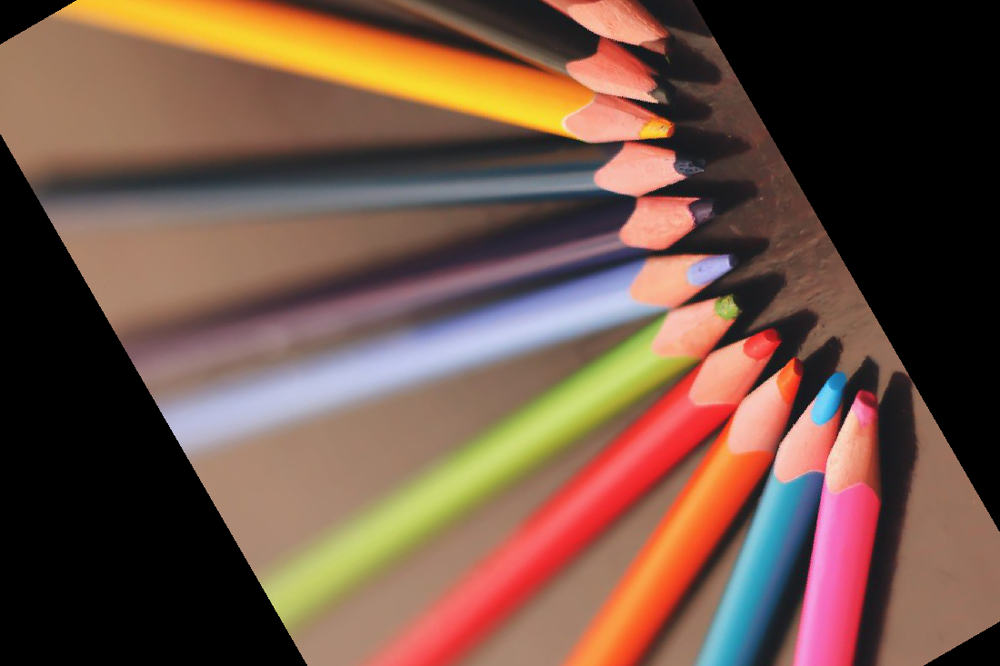

In [78]:
# the image will get cut-off

pencils.rotate(120)

<br><br>

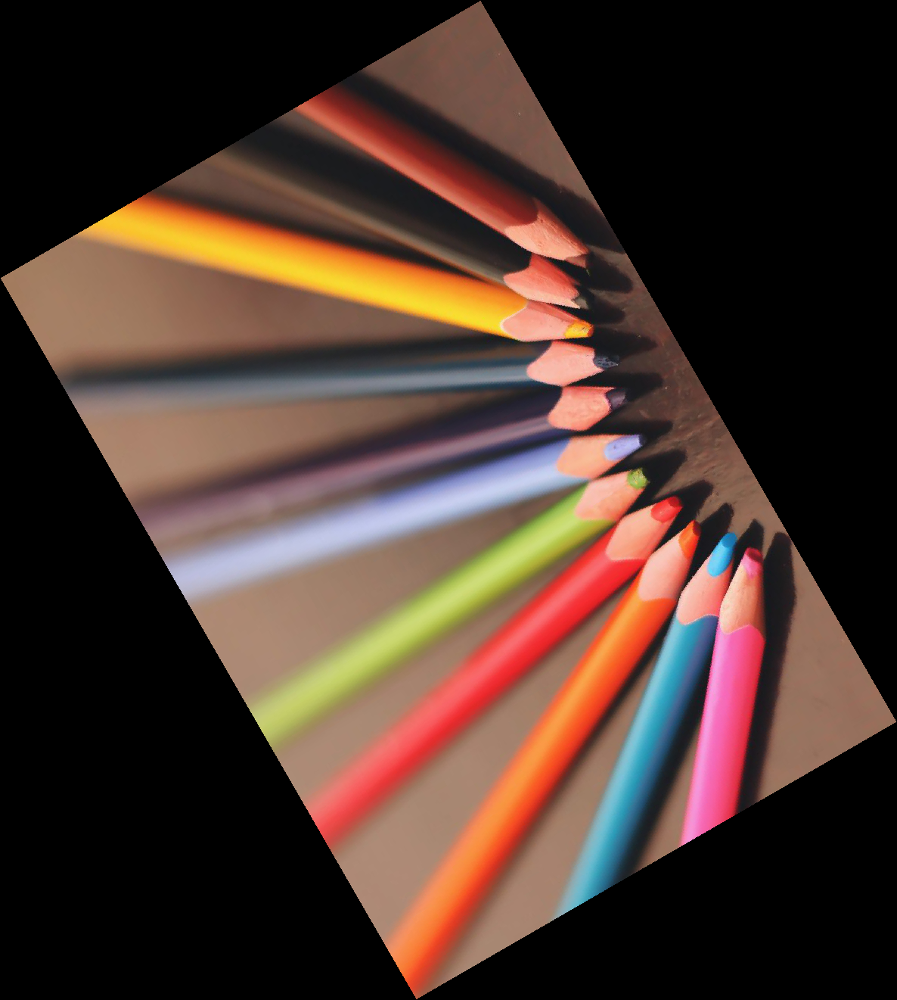

In [79]:

pencils.rotate(120, expand=True)

<br><br>

## Transparency

**RGBA stands for RED, Green, Blue, Alpha**) where values of each component can go from 0 to 255.

**If, Alpha = 0 => image is completely Transparent.<br>If, Alpha = 255 => image is completely Opaque.**

You can create your own color here to check for possible values: https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool

We can adjust image alpha values with the `.putalpha()` method:



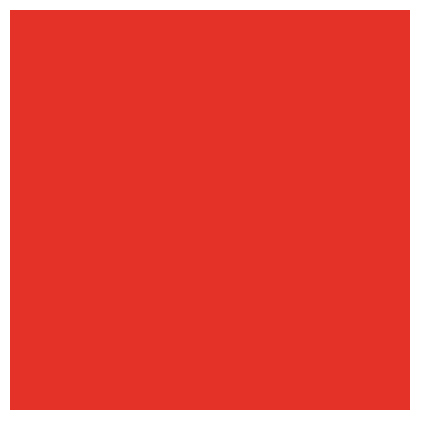

In [81]:
red = Image.open('example-Red.png')

red

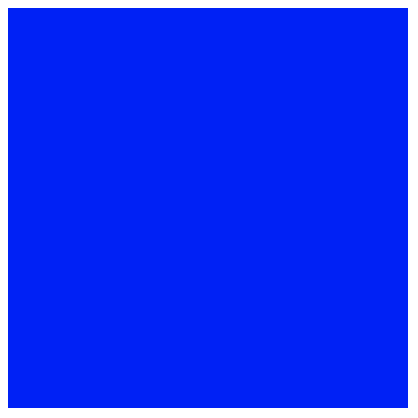

In [82]:
blue = Image.open('example-Blue.png')

blue

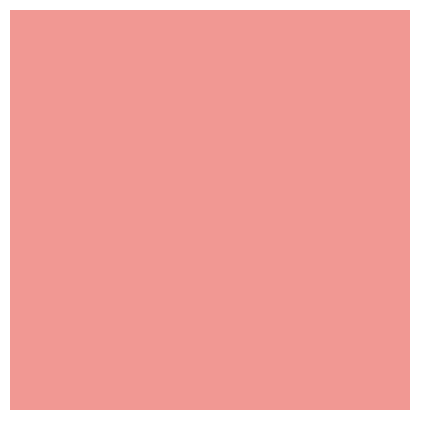

In [84]:
# applying alpha

red.putalpha(128)

red

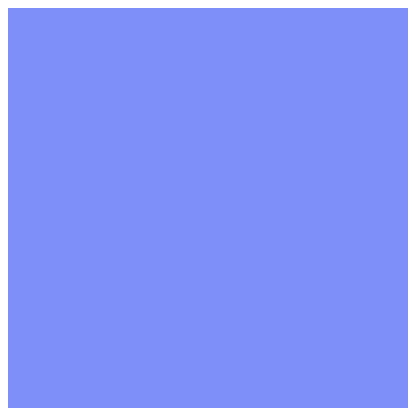

In [85]:
blue.putalpha(128)

blue

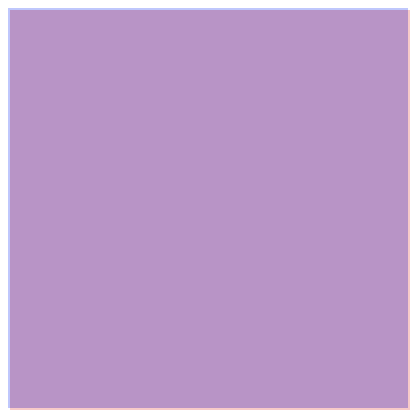

In [86]:
# Get back an image that is more purple, i.e. to mix/paste a red image on-top-of a blue image.

blue.paste(red, box=(0,0), mask=red)
blue

<br><br>**Transparency** and **Masking** can be much more complex than what we've shown here, if you find yourself needing something more, check out the documentation : https://pillow.readthedocs.io/en/stable/

## Saving the Image

Let's save this updated "blue" image as "purple.png" in this folder.

In [87]:
blue.save("purple.png")

**Tip :** If a file by the name, purple.png, already exists then upon saving this new file it will get overwritten and older file of the same name would be lost, so just keep this in mind while dealing `.save()`.

Let's check if that worked correctly...

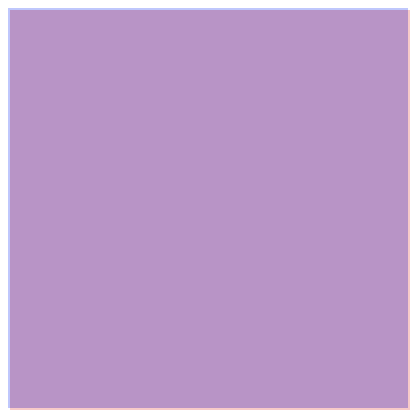

In [88]:
Image.open('purple.png')

#### Great work!